In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection  import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from  pandas_profiling import ProfileReport
import csv
#! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

# DECISION TREE

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/DATA Set/winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
with open('/content/drive/MyDrive/Colab Notebooks/DATA Set/winequality-red.csv' , 'r') as f:
    next(f)
    reader = csv.reader(f, delimiter = '\n')
    for i in enumerate(reader):
        for lst in (i[1]):
            print((lst))


7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.2,0.68,9.8,5
7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.997,3.26,0.65,9.8,5
11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.998,3.16,0.58,9.8,6
7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
7.4,0.66,0.0,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
7.9,0.6,0.06,1.6,0.069,15.0,59.0,0.9964,3.3,0.46,9.4,5
7.3,0.65,0.0,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
7.5,0.5,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.8,10.5,5
6.7,0.58,0.08,1.8,0.09699999999999999,15.0,65.0,0.9959,3.28,0.54,9.2,5
7.5,0.5,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.8,10.5,5
5.6,0.615,0.0,1.6,0.08900000000000001,16.0,59.0,0.9943,3.58,0.52,9.9,5
7.8,0.61,0.29,1.6,0.114,9.0,29.0,0.9974,3.26,1.56,9.1,5
8.9,0.62,0.18,3.8,0.17600000000000002,52.0,145.0,0.9986,3.16,0.88,9.2,5
8.9,0.62,0.19,3.9,0.17,51.0,148.0,0.9986,3.17,0.93,9.2,5
8.5,0.28,0.56,1.8,0.092,35.0,103.0,0.9969,3.3,0.75,10.5,7

In [ ]:
import os
files = os.listdir('/')
files

['srv',
 'var',
 'mnt',
 'home',
 'dev',
 'bin',
 'usr',
 'lib64',
 'tmp',
 'run',
 'opt',
 'media',
 'sys',
 'sbin',
 'root',
 'lib',
 'boot',
 'proc',
 'etc',
 'content',
 '.dockerenv',
 'datalab',
 'tools',
 'lib32',
 'python-apt',
 'NGC-DL-CONTAINER-LICENSE']

In [ ]:
df.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
1598,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


In [ ]:
df['fixed acidity'] = df['fixed acidity'].str[6:]
csv['Wafer'] = csv['Wafer'].str[6:]


AttributeError: ignored

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Target variable is never normalized**

In [ ]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [ ]:
x = df.drop(columns = ['quality'])
y = df['quality']


In [ ]:
x_train,x_test,y_train, y_test = train_test_split(x, y ,test_size = .2, random_state=300)

In [ ]:
model_dt = DecisionTreeClassifier()
model_dt.fit(x_train,y_train)


DecisionTreeClassifier()

In [ ]:
# visulize the tree formed
import sklearn
import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
plt.figure(figsize = (20, 20))
tree.plot_tree(model_dt, filled = True)

In [ ]:
df1 = df.head(30)

In [ ]:
x1 = df1.drop(columns = ['quality'])
y1 = df1.quality

In [ ]:
model_dt1 = DecisionTreeClassifier()
model_dt1.fit(x1,y1)

DecisionTreeClassifier()

[Text(0.375, 0.9166666666666666, 'volatile acidity <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(0.16666666666666666, 0.75, 'free sulfur dioxide <= 32.0\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]'),
 Text(0.08333333333333333, 0.5833333333333334, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]'),
 Text(0.25, 0.5833333333333334, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(0.5833333333333334, 0.75, 'total sulfur dioxide <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(0.4166666666666667, 0.5833333333333334, 'sulphates <= 0.58\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(0.3333333333333333, 0.4166666666666667, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(0.5, 0.4166666666666667, 'alcohol <= 9.65\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(0.4166666666666667, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(0.5833333333333334, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 T

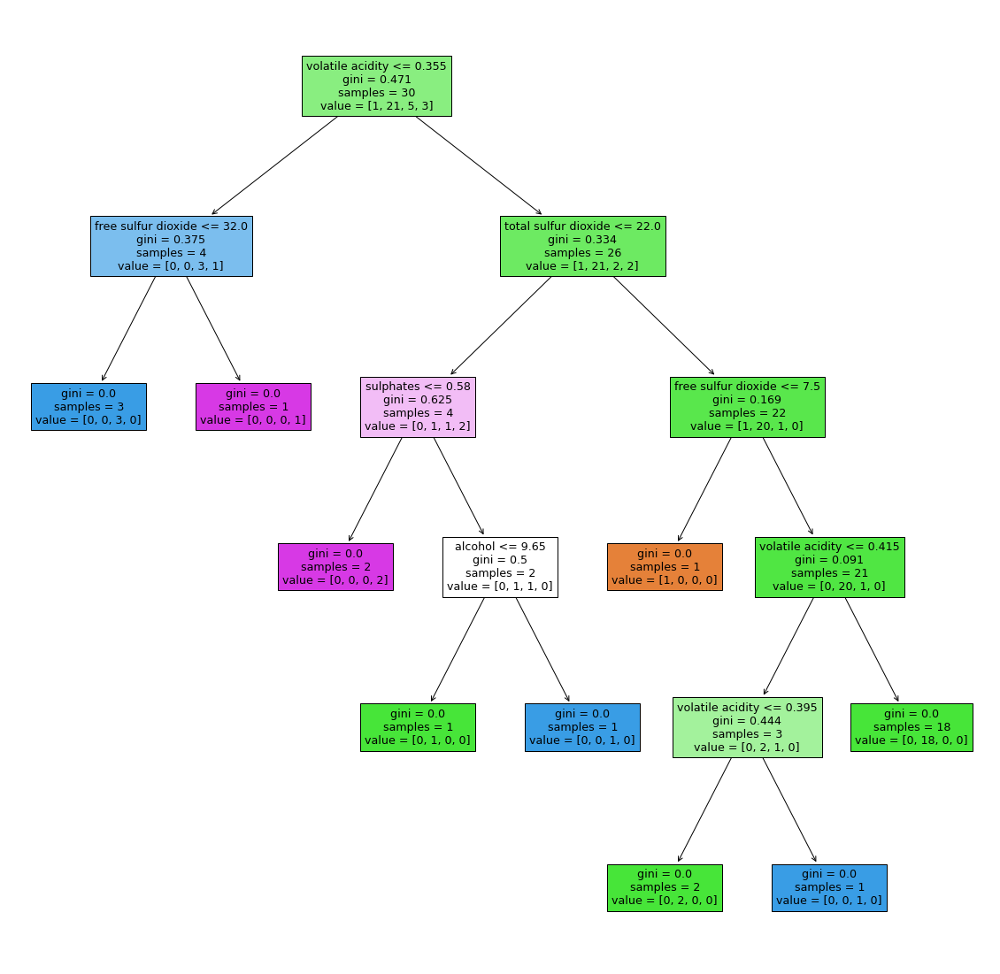

In [ ]:
plt.figure(figsize = (20, 20))
tree.plot_tree(model_dt1, filled = True, feature_names=x1.columns )

In [ ]:
model_dt1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6])

In [ ]:
model_dt1.score(x1,y1)
# testing for the unknown dataset

model_dt1.score(x_test,y_test)
# Conclusion: model is overfitted
# training and testing score has large difference

0.396875

### Pruning: using **ccp_alpha**

What effect on the model can be seen if we reduce the leave node can be understood by the CCP_alpha. By default its value is 0 means that the tree keep on creating the branches untill the pure  leaf mode  is observed.

**ccp_alpha** : non-negative float, default=0.Complexity parameter used for Minimal Cost-Complexity Pruning. The subtree with the largest cost complexity that is smaller than ccp_alpha will be chosen. By default, no pruning is performed.



In [ ]:
#tuning the model / pruning the model
path = model_dt1.cost_complexity_pruning_path(x1,y1)
path


{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [ ]:
ccp_alphas = path.ccp_alphas
ccp_alphas

array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
       0.06075036, 0.08216783, 0.13136752])

Plotting the graph between the aplha and training and testing score

In [ ]:
model_lst = []
for ccp in ccp_alphas:
    dt_m = DecisionTreeClassifier(ccp_alpha= ccp)
    dt_m.fit(x1,y1)
    model_lst.append(dt_m)


In [ ]:
train_score = [i.score(x1 , y1) for i in model_lst]
test_score = [i.score(x_test , y_test) for i in model_lst]

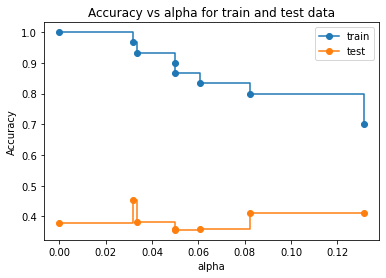

In [ ]:
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy vs alpha for train and test data')
ax.plot(ccp_alphas, train_score, marker = 'o', label = 'train', drawstyle = 'steps-post')
ax.plot(ccp_alphas, test_score, marker = 'o', label = 'test', drawstyle = 'steps-post')
ax.legend()
plt.show()

Select the model that has same train score and test score.

ccp_alphas, somewhat more than .13, will have close train and test score  

Also model has missied some important patterns thats the reason we are getting such low accuracy  

Building model with 150 dataset

In [ ]:
df2 = df.head(150)
x2 = df2.drop(columns = ['quality'])
y2 = df2['quality']


In [ ]:
model_dt2 = DecisionTreeClassifier()


In [ ]:
#tuning the model / pruning the model
path = model_dt2.cost_complexity_pruning_path(x2,y2)
path


{'ccp_alphas': array([0.        , 0.00640351, 0.00666667, 0.00666667, 0.00666667,
        0.00888889, 0.00888889, 0.01      , 0.01      , 0.01111111,
        0.01185185, 0.01185185, 0.01185185, 0.0119928 , 0.01222222,
        0.01250712, 0.01333333, 0.016     , 0.01896296, 0.01925926,
        0.01927271, 0.01980769, 0.02289683, 0.02623115, 0.03753844]),
 'impurities': array([0.        , 0.02561404, 0.0322807 , 0.03894737, 0.04561404,
        0.05450292, 0.06339181, 0.07339181, 0.08339181, 0.09450292,
        0.11820663, 0.13005848, 0.14191033, 0.15390313, 0.16612536,
        0.17863248, 0.19196581, 0.20796581, 0.22692877, 0.24618803,
        0.32327887, 0.34308656, 0.41177704, 0.46423934, 0.50177778])}

In [ ]:
ccp_alphas = path.ccp_alphas
ccp_alphas

array([0.        , 0.00640351, 0.00666667, 0.00666667, 0.00666667,
       0.00888889, 0.00888889, 0.01      , 0.01      , 0.01111111,
       0.01185185, 0.01185185, 0.01185185, 0.0119928 , 0.01222222,
       0.01250712, 0.01333333, 0.016     , 0.01896296, 0.01925926,
       0.01927271, 0.01980769, 0.02289683, 0.02623115, 0.03753844])

In [ ]:
model_lst = []
for ccp in ccp_alphas:
    dt_m = DecisionTreeClassifier(ccp_alpha= ccp)
    dt_m.fit(x2,y2)
    model_lst.append(dt_m)


In [ ]:
train_score = [i.score(x2 , y2) for i in model_lst]
test_score = [i.score(x_test , y_test) for i in model_lst]

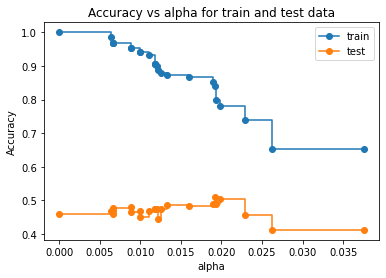

In [ ]:
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy vs alpha for train and test data')
ax.plot(ccp_alphas, train_score, marker = 'o', label = 'train', drawstyle = 'steps-post')
ax.plot(ccp_alphas, test_score, marker = 'o', label = 'test', drawstyle = 'steps-post')
ax.legend()
plt.show()

Building model with 500 dataset

In [ ]:
df2 = df.head(500)
x2 = df2.drop(columns = ['quality'])
y2 = df2['quality']


In [ ]:
model_dt2 = DecisionTreeClassifier()


In [ ]:
#tuning the model / pruning the model
path = model_dt2.cost_complexity_pruning_path(x2,y2)
path


{'ccp_alphas': array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
        0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
        0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
        0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
        0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
        0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
        0.00373809, 0.0038    , 0.0038237 , 0.004     , 0.00404444,
        0.00428571, 0.00437662, 0.00462338, 0.00465709, 0.00466667,
        0.0048    , 0.00495726, 0.00504242, 0.00508235, 0.00509091,
        0.00510606, 0.00516667, 0.00568485, 0.00589394, 0.00656364,
        0.00671079, 0.0067591 , 0.

In [ ]:
ccp_alphas = path.ccp_alphas
ccp_alphas

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
       0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
       0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
       0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
       0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
       0.00373809, 0.0038    , 0.0038237 , 0.004     , 0.00404444,
       0.00428571, 0.00437662, 0.00462338, 0.00465709, 0.00466667,
       0.0048    , 0.00495726, 0.00504242, 0.00508235, 0.00509091,
       0.00510606, 0.00516667, 0.00568485, 0.00589394, 0.00656364,
       0.00671079, 0.0067591 , 0.00688352, 0.00688889, 0.007  

In [ ]:
model_lst = []
for ccp in ccp_alphas:
    dt_m = DecisionTreeClassifier(ccp_alpha= ccp)
    dt_m.fit(x2,y2)
    model_lst.append(dt_m)


In [ ]:
train_score = [i.score(x2 , y2) for i in model_lst]
test_score = [i.score(x_test , y_test) for i in model_lst]

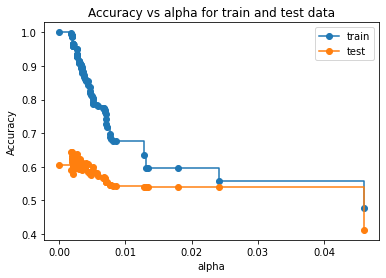

In [ ]:
fig, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy vs alpha for train and test data')
ax.plot(ccp_alphas, train_score, marker = 'o', label = 'train', drawstyle = 'steps-post')
ax.plot(ccp_alphas, test_score, marker = 'o', label = 'test', drawstyle = 'steps-post')
ax.legend()
plt.show()

It means any alpha value between .011 to .03 will give almost same train and test score

So over fitting nature of model has been reduced

Building the model with ccp_alpha  = .015

In [ ]:
model_dt_ccp = DecisionTreeClassifier(random_state = 0, ccp_alpha = .015 )
model_dt_ccp.fit(x2,y2)

DecisionTreeClassifier(ccp_alpha=0.015, random_state=0)

[Text(0.5, 0.8333333333333334, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.25, 0.5, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(0.75, 0.5, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

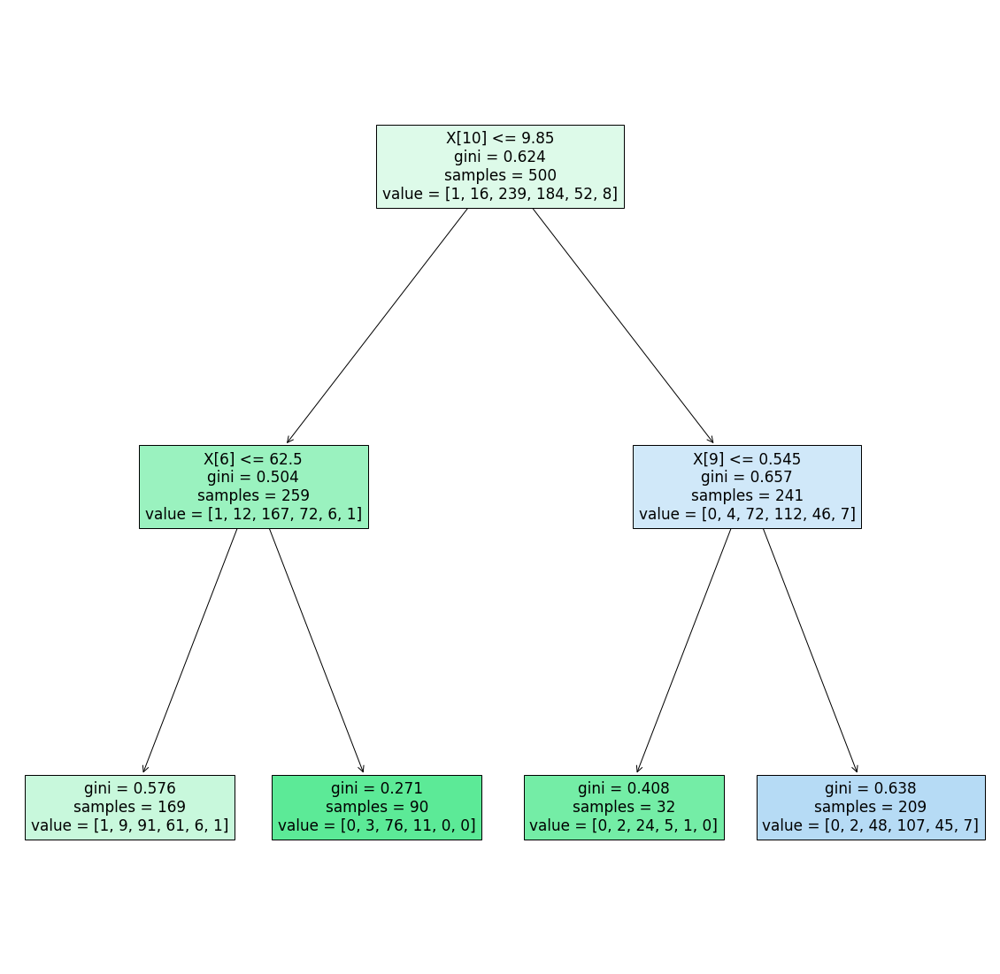

In [ ]:
plt.figure(figsize=(20,20))
tree.plot_tree(model_dt_ccp, filled = True)

In [ ]:
model_dt_ccp.score(x2,y2)


0.596

In [ ]:
model_dt_ccp.score(x_test, y_test)

0.540625

**Observation:** If accuracy score is very high on training data and very low on test data then such model is not robust and wont work for unknown dataset. If the test score and train score are close then we can say our **model is robust**

### Hyper parameter tuning
GridSearchCV, RandomSearchCV

GridSearchCV will take all the parameter and test the model. Random Search CV will randomly select some of the parameter and then bulid the model.

Problem with the ablove approach is that is high time cosuming process. Further repeting the same for 10 more parameter is not an efficient task

In [ ]:
# creating the grid of parameter
DecisionTreeClassifier()
grid_param = {  'criterion' : ["gini", "entropy"],
                            'splitter' : ['best', 'random'],
                            'max_depth': range(2, 40,1),
                            'min_samples_split' : range(2,10,1),
                            'min_samples_leaf' : range(1,10,1)   }
model_grid = GridSearchCV(estimator = model_dt_ccp, param_grid = grid_param, cv = 5)

In [ ]:
model_grid.fit(x2, y2)


In [ ]:
# extracting the model parameter
model_grid.best_params_

{'criterion': 'entropy',
 'max_depth': 12,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'random'}

In [ ]:
# building the model on above parameter
model_dt_tuned = DecisionTreeClassifier(criterion= 'entropy',
                                                                    max_depth = 12,
                                                                    min_samples_leaf = 1,
                                                                    min_samples_split = 2,
                                                                    splitter = 'random')

model_dt_tuned.fit(x2,y2)
# Testing for the score for train and test dataset
model_dt_tuned.score(x2,y2)
model_dt_tuned.score(x_test, y_test)


0.578125

**NOTE:** Even after tuning we see huge difference in the accuracy score of the training set and the test set. So always hyper parameter tuning will give the best model

# BAGGING BASED MODEL


Over here a bag caontaing various similar ML algorithms are created and then prediction is done based on voting be each of the algorithms.

One such algo is **Random Forest**


In [ ]:
from sklearn.ensemble import BaggingClassifier


In [ ]:
x_train, x_test, y_train, y_test  = train_test_split(x, y , random_state = 0)

In [ ]:
bag_dt = BaggingClassifier(base_estimator = DecisionTreeClassifier() , n_estimators = 100)
bag_dt.fit(x_train, y_train)
bag_dt.predict(x_test)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100)

In [ ]:
bag_dt.classes_
bag_dt.base_estimator_
bag_dt.estimator_params

()

In [ ]:
# buinding the bagging model with KNN
from sklearn.neighbors import KNeighborsClassifier
bag_knn = BaggingClassifier(base_estimator = KNeighborsClassifier(), n_estimators=10)
bag_knn.fit(x_train,y_train)
bag_knn.predict(x_test)


In [ ]:
bag_dt.score(x_test, y_test)

0.69

In [ ]:
bag_knn.score(x_test, y_test)

# on selecting the best possible parameter then accuracy will changed.

0.4975

## RANDOM FOREST

In [ ]:
# random forest by default uses decision tree
from sklearn.ensemble import RandomForestClassifier
model_rf = RandomForestClassifier()
model_rf.fit(x_train, y_train)
model_rf.predict(x_test)
model_rf.score(x_test, y_test)

0.69

In [ ]:
# Visulaizing the tree drawn by the random forest
model_rf = RandomForestClassifier( n_estimators = 5)
model_rf.fit(x_train,y_train)

model_rf.estimators_

# plotting the 0th tree
plt.figure(figsize = (20,20))
tree.plot_tree(model_rf.estimators_[0], filled = True)

# all the different model will have different data set given to it, So all the plot will be different

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [ ]:
# to plot all the model use for loop

plt.figure(figsize = (20, 20))
# for i in range(model_rf.n_estimators):
#    tree.plot_tree(model_rf.estimators_[i] , filled  = True)

# time consuming task

### Hyper parameter tuning of RF

Using grid Search CV or Random search CV

In [ ]:
# creating the dict of the parametrers
grid_param = {
    'n_estimators': [10, 20, 50, 100, 120, 150] ,
    'criterion' : ["gini", "entropy"],
    'max_depth' : range(10),
    'min_samples_leaf' : range(10)
}

In [ ]:
model_rf = RandomForestClassifier(n_estimators = 5)

In [ ]:
model_grid_rf = GridSearchCV(estimator = model_rf, param_grid = grid_param, cv = 10, verbose = 1)


In [ ]:
model_grid_rf.fit(x_train,y_train)

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:680: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
2280 fits failed out of a total of 12000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1200 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py", line 467, in fit
    for i, t in enumerate(tr

GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [10, 20, 50, 100, 120, 150]},
             verbose=1)

In [ ]:
model_grid_rf.best_params_
model_rf = RandomForestClassifier(criterion = 'entropy' , max_depth = 9, n_estimators = 150 , min_samples_leaf = 1)
model_rf.fit(x_train, y_train)
model_rf.score(x_test,y_test)

0.6625

building the model with criterion as entropy

In [ ]:
model_dt = DecisionTreeClassifier(criterion = 'entropy')
model_dt.fit(x_train, y_train)
model_dt.score(x_test, y_test)

0.6

In [ ]:
# creating dot file. To visualise the tree
outfile  = open('model_dt_meta.dot', 'w')
tree.export_graphviz(model_dt, out_file = outfile, feature_names = x.columns)

In [ ]:
dir() # show the file available